In [1]:
#| export

# import kagglehub

import os
import io
import re
import random
import base64
from io import BytesIO

import time
from datetime import timedelta

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F

from IPython.display import SVG

from PIL import Image


import cv2


from diffusers import StableDiffusionPipeline
from transformers import AutoProcessor, AutoModel
import metric


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

decoded text =  100
decoded text =  100
Does <image> portray "SVG illustration of a red circle" without any lettering? Answer yes or no.
decoded text =  100
decoded text =  100


## Competition Metric Helpers

We also want to evaluate metrics of the original bitmap before converting to svg. Let’s implement it using [metric package](https://www.kaggle.com/code/jiazhuang/svg-image-fidelity).

In [2]:
import numpy as np
import statistics
import pandas as pd

def image_resize(image, size=(384, 384)):
    return image.convert('RGB').resize(size)

def bitmap_score_instance_impl(multiple_choice_qa, image, random_seed=42):
    rng = np.random.RandomState(random_seed)
    group_seed = rng.randint(0, np.iinfo(np.int32).max)
    image_processor = metric.ImageProcessor(image=image_resize(image), seed=group_seed).apply()
    image = image_processor.image.copy()
    questions = multiple_choice_qa['question']
    choices = multiple_choice_qa['choices']
    answers = multiple_choice_qa['answer']
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    vqa_score = metric.vqa_evaluator.score(questions, choices, answers, image)
    image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
    ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    instance_score = metric.harmonic_mean(vqa_score, aesthetic_score, beta=0.5) * ocr_score
    return instance_score, vqa_score, ocr_score, aesthetic_score

def bitmap_score_instance(multiple_choice_qa, image, random_seed=42):
    is_single = not isinstance(image, list)
    if is_single:
        multiple_choice_qa = [multiple_choice_qa]
        image = [image]
    
    assert len(multiple_choice_qa) == len(image)

    results = []
    score_df = []
    for one_image, one_multiple_choice_qa in zip(image, multiple_choice_qa, strict=True):
        instance_score, vqa_score, ocr_score, aesthetic_score = bitmap_score_instance_impl(one_multiple_choice_qa, one_image, random_seed=42)
        results.append(instance_score)
        score_df.append([instance_score, vqa_score, ocr_score, aesthetic_score])

    fidelity = statistics.mean(results)
    score_df = pd.DataFrame(score_df, columns=['competition_score', 'vqa_score', 'ocr_score', 'aesthetic_score'])
    if is_single:
        return score_df.iloc[0].to_dict()
    else:
        return float(fidelity), score_df

## Load Stable Diffusion

In [3]:
#| export
# !pip install peft
# Ensure GPU is being used and optimize for speed
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")


import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler, StableDiffusionXLPipeline
from diffusers import AutoPipelineForText2Image
from diffusers.utils import load_image
from diffusers import StableDiffusionXLPipeline, LCMScheduler
from diffusers.utils import load_image
from diffusers.utils.import_utils import is_xformers_available


# sd2 =============================================================
# Load with optimized scheduler and half precision
stable_diffusion_path = 'stable-diffusion-v2-pytorch-1-v1'

scheduler = DDIMScheduler.from_pretrained(stable_diffusion_path, subfolder="scheduler")

pipe = StableDiffusionPipeline.from_pretrained(
    stable_diffusion_path,
    scheduler=scheduler,
    torch_dtype=torch.float16,  # Use half precision
    safety_checker=None         # Disable safety checker for speed
)

# Move to GPU and apply optimizations
pipe.to(device) 

Using device: cuda:0


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.33.1",
  "_name_or_path": "stable-diffusion-v2-pytorch-1-v1",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [4]:
def generate_bitmap(prompt, negative_prompt="", num_inference_steps=25, guidance_scale=20):
        
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=num_inference_steps, 
        guidance_scale=guidance_scale,
        # height=512,
        # width=512,
    ).images[0]
    
    return image

## Load Data

In [5]:
import pandas as pd
import json

In [7]:
train_df = pd.read_csv('train.csv')
train_question_df = pd.read_parquet('questions.parquet')

In [8]:
train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))
train_question_df = train_question_df.reset_index(name='qa')

train_question_df['question'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['question'], ensure_ascii=False))

train_question_df['choices'] = train_question_df.qa.apply(
    lambda qa: json.dumps(
        [x.tolist() for x in qa['choices']], ensure_ascii=False
    )
)

train_question_df['answer'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['answer'], ensure_ascii=False))

train_df = pd.merge(train_df, train_question_df, how='left', on='id')

train_df['multiple_choice_qa'] = train_df.apply(
    lambda r: {
    'question': json.loads(r.question),
    'choices': json.loads(r.choices),
    'answer': json.loads(r.answer)
    },
    axis=1,
)

train_df.head()

/tmp/ipykernel_138940/3218796089.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))


,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


# new FUNCTION img -> svg

In [10]:
import re
import vtracer
from IPython.display import SVG, display, Image
from PIL import Image as PILImage
input_path = "output.png"
output_path = "output.svg"

In [ ]:
def convert_paths_to_polygons(svg_code: str, size: int) -> str:
    # Find all path elements
    scale_factor = 384 / size

    path_pattern = re.compile(
        r'<path[^>]*d="([^"]+)"[^>]*fill="([^"]+)"[^>]*transform="translate\(([^)]+)\)"[^>]*/?>'
    )
    paths = path_pattern.findall(svg_code)

    polygons = []

    for d_content, fill_color, translate in paths:
        tx, ty = map(float, translate.split(','))
        points = []
        tokens = re.findall(r'[MLZmlz]|-?\d+\.?\d*,\-?\d+\.?\d*', d_content.strip())
        for token in tokens:
            if token in {'M', 'L', 'Z', 'm', 'l', 'z'}:
                continue
            x_str, y_str = token.split(',')
            x = int(round(float(x_str) + tx))
            y = int(round(float(y_str) + ty))
            points.append(f"{x},{y}")

        if points:
            polygon = f'<polygon points="{" ".join(points)}" fill="{fill_color}"/>'
            polygons.append(polygon)

    # Build the compact SVG
    new_svg = (
        f'<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale({scale_factor})">'
        + "".join(polygons)
        + '</g></svg>'
    )

    return new_svg


def fix_svg_size(svg_code: str, target_size: int = 384) -> str:
    """
    Update the <svg> tag's width and height to match target size.
    """
    # Replace width attribute
    svg_code = re.sub(
        r'(width\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    # Replace height attribute
    svg_code = re.sub(
        r'(height\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    return svg_code


def bitmap_to_svg_layered(img, input_path, output_path):
    
    # Define input and output paths
    # (input_path and output_path are already passed as arguments)

    # Step 1: Resize the input image to 256x256
    # 256x256 is helpful bc each length od path is shorter, so with the same max_svg_length, we can have more paths(more color)
    size = 128
    img = img.resize((size,size), PILImage.LANCZOS)
    img.save(input_path)

    # Step 2: Convert the resized image to SVG
    layer_difference = 10  # initial value
    max_svg_length = 9996  # target length limit

    # Define injection to prevent OCR hallucination
    injection_a1 = '\n<path d="M5 374 L10 364 L15 374 M7 368 L13 368" stroke="white"/>'      # Bottom-left A
    injection_a2 = '\n<path d="M364 30 L370 20 L376 30 M367 25 L373 25" stroke="white"/>'         # Top-right A
    injection = injection_a1 + injection_a2
    injection_length = len(injection)

    while True:
        vtracer.convert_image_to_svg_py(
            input_path,
            output_path,
            colormode='color',        # Options: 'color' or 'binary'
            hierarchical='stacked',   # Options: 'stacked' or 'cutout'
            mode='polygon',           # Options: 'spline', 'polygon', or 'none'
            filter_speckle=3,          # remove tiny regions
            color_precision=8,         # reduce color complexity
            layer_difference=layer_difference,  # more aggressive merging
            corner_threshold=10,       # remove subtle corners
            length_threshold=10,       # remove short paths
            max_iterations=10,         # faster, less detail
            splice_threshold=10,       # simplify curves
            path_precision=3           # reduce vertex detail
        )

        # Step 3: Read and display the SVG
        try:
            with open(output_path, "r", encoding="utf-8") as f:
                svg_code = f.read()
        except UnicodeDecodeError:
            # Bad SVG output (probably corrupted), try again
            continue  # go back to start of while loop

        # Clean the first two lines if present
        lines = svg_code.splitlines()
        removed_length = 0
        if lines and lines[0].strip().startswith('<?xml'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        if lines and lines[0].strip().startswith('<!--'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        svg_code = "\n".join(lines)

        svg_code = svg_code.replace(
            '<svg ',
            '<svg viewBox="0 0 384 384" ', #this is 20 bytes more
            1  # only replace first occurrence
        )
        
        # remove version and xmlns attributes
        svg_code = re.sub(r'\s*version="[^"]*"', '', svg_code)
        svg_code = re.sub(r'\s*xmlns="[^"]*"', '', svg_code)

        # use polygon instead of path
        svg_code = convert_paths_to_polygons(svg_code, size)
            
        # Correct length check: give credit for removed lines
        if len(svg_code) + injection_length <= max_svg_length: # acount for injection
            break
        else:
            layer_difference += 10

    svg_code = fix_svg_size(svg_code, target_size=384) # doesnt change length

    # Inject fake letter path to prevent OCR hallucination
    svg_code = svg_code.replace("</svg>", injection + "</svg>")

    print(f'{layer_difference=}')
      
    return svg_code

# IMAGE -> SVG

In [12]:
from IPython.display import SVG

In [13]:
def get_aes_and_ocr_score(svg_content, aes=True, ocr=True):
    image_processor = metric.ImageProcessor(image=metric.svg_to_png(svg_content), seed=42).apply()
    image = image_processor.image.copy()

    aesthetic_score = metric.aesthetic_evaluator.score(image) if aes else 1.0

    if ocr:
        image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
        ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    else:
        ocr_score = 1.0

    return aesthetic_score, ocr_score

## Implement the package Model class

In [14]:
#| export

class Model:
    def __init__(self):
        self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
        self.prompt_prefix = "Simple, classic image of"
        self.prompt_suffix = "with flat color blocks, beautiful, minimal details, solid colors only"
        self.negative_prompt = "lines, framing, hatching, background, textures, patterns, details, outlines"
        # self.num_inference_steps = 25
        # self.guidance_scale = 20
        self.num_attempt = 5

    def gen_bitmap(self, description):
        prompt = f'{self.prompt_prefix} {description}{self.prompt_suffix}'
        bitmap = generate_bitmap(prompt, self.negative_prompt)
        return bitmap

    def predict_impl(self, prompt: str) -> str:
        best_score = 0.0
        best_svg = None
        best_img = None
        print(f'======= {prompt} =======')
        for i in range(self.num_attempt):
            bitmap = self.gen_bitmap(prompt)
            display(bitmap)
            svg = bitmap_to_svg_layered(bitmap, input_path, output_path)
            aesthetic_score, ocr_score = get_aes_and_ocr_score(svg)
            score = aesthetic_score * ocr_score
            print(f'{score=}')
            print('svg length:', len(svg))
            if score >= best_score:
                best_score = score
                best_svg = svg
                best_img = bitmap
                # print('update score:', best_score)
        print('final score:', best_score)
        print('=======================================================================')
        
        if best_svg is None:
            best_svg = self.default_svg

        return best_svg, best_img

    def predict(self, prompt: str) -> str:
        svg, img = self.predict_impl(prompt)
        return svg

In [15]:
model = Model()

A digital painting of magenta trapzoid layered on a translucent silver sheet. In the middle of the painting is a trapezoid in magenta color. A transluscent silver sheet is placed under it.
======= A digital painting of magenta trapzoid layered on a translucent silver sheet. In the middle of the painting is a trapezoid in magenta color. A transluscent silver sheet is placed under it. =======


  0%|          | 0/25 [00:00<?, ?it/s]

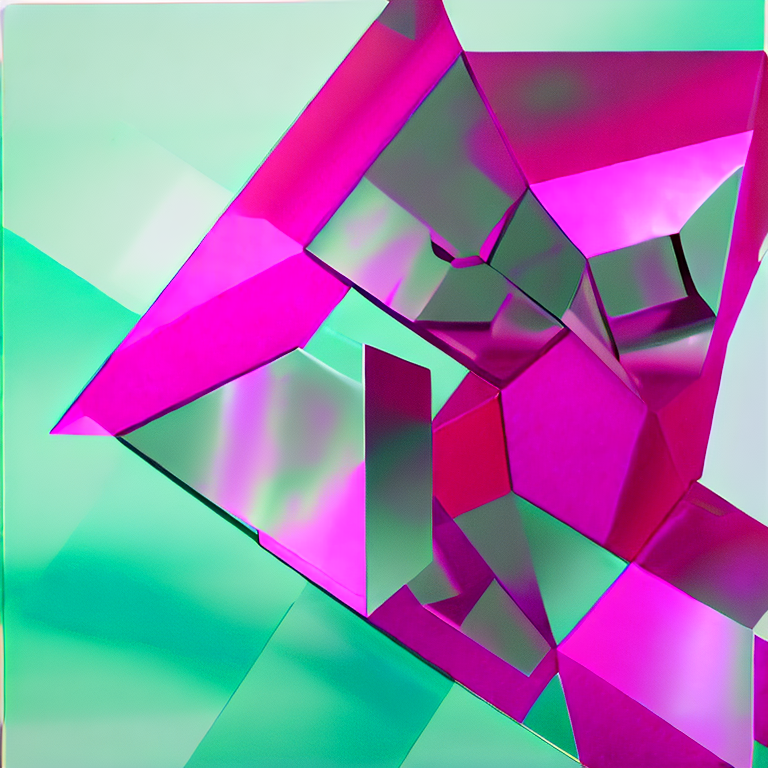

layer_difference=60
decoded text =  A
score=0.4379310607910156
svg length: 9120


  0%|          | 0/25 [00:00<?, ?it/s]

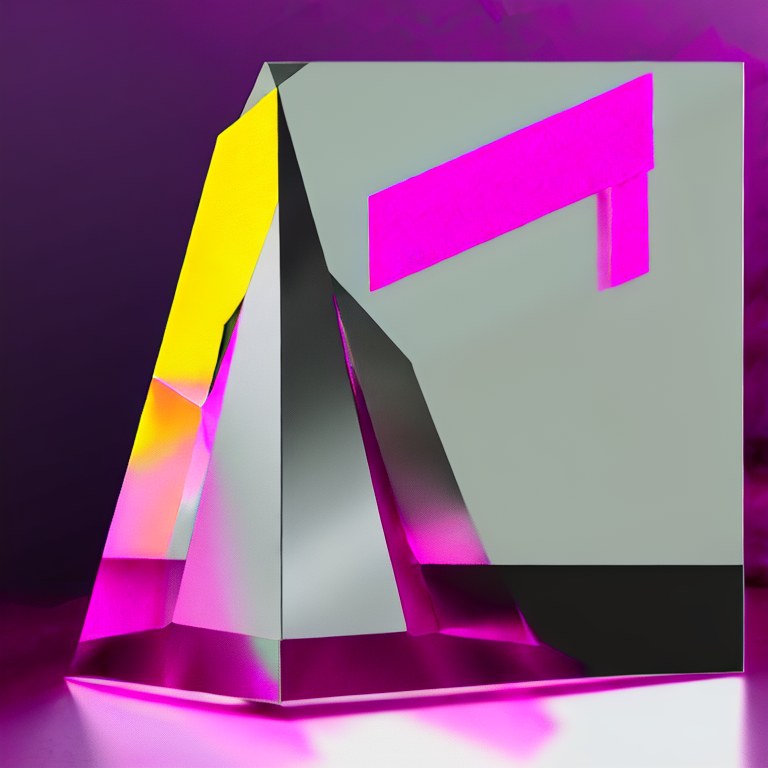

layer_difference=40
decoded text =  A
score=0.45497746467590333
svg length: 9008


  0%|          | 0/25 [00:00<?, ?it/s]

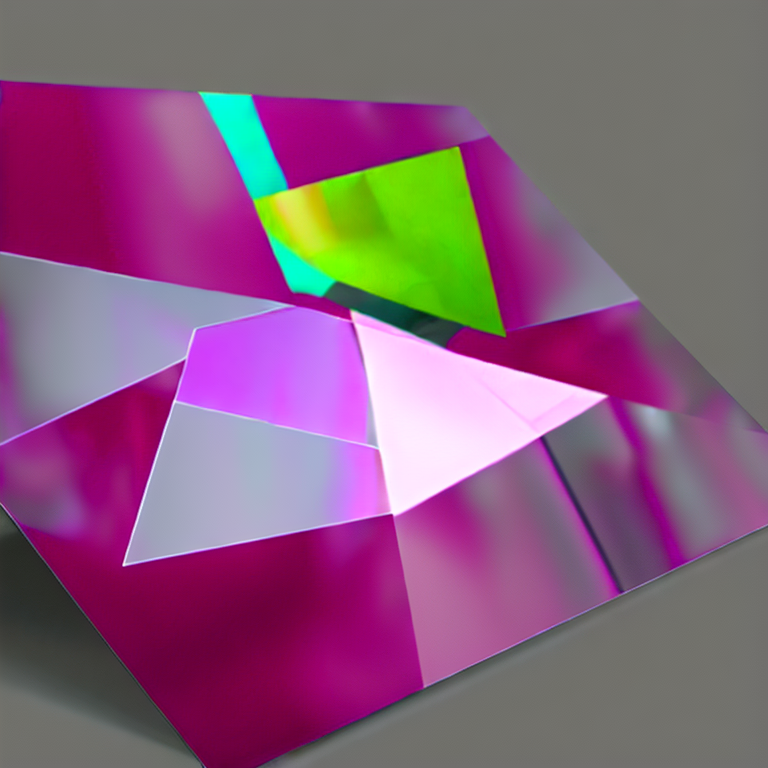

layer_difference=40
decoded text =  A
score=0.4440289497375488
svg length: 7882


  0%|          | 0/25 [00:00<?, ?it/s]

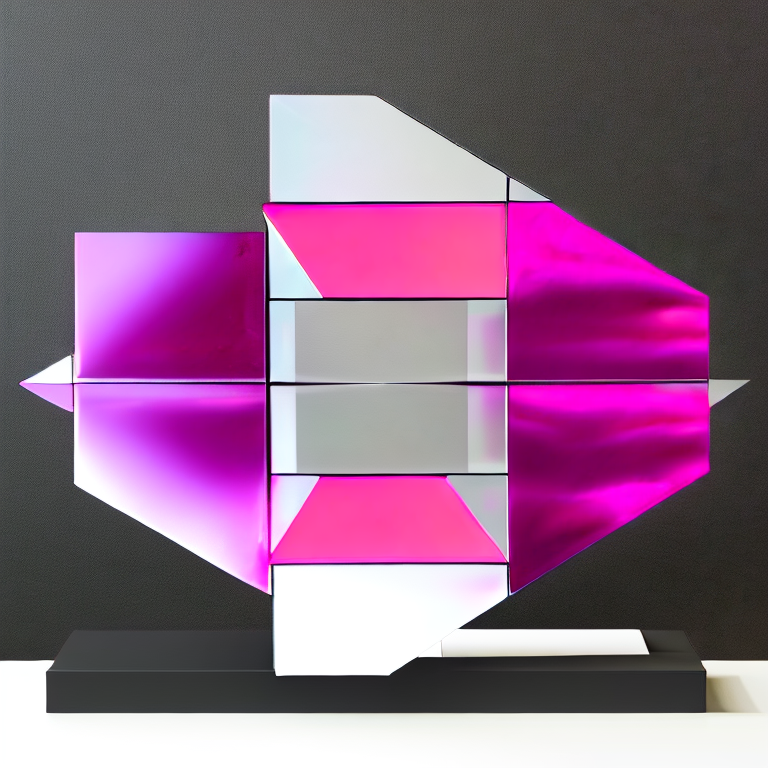

layer_difference=40
decoded text =  A
score=0.44638876914978026
svg length: 8479


  0%|          | 0/25 [00:00<?, ?it/s]

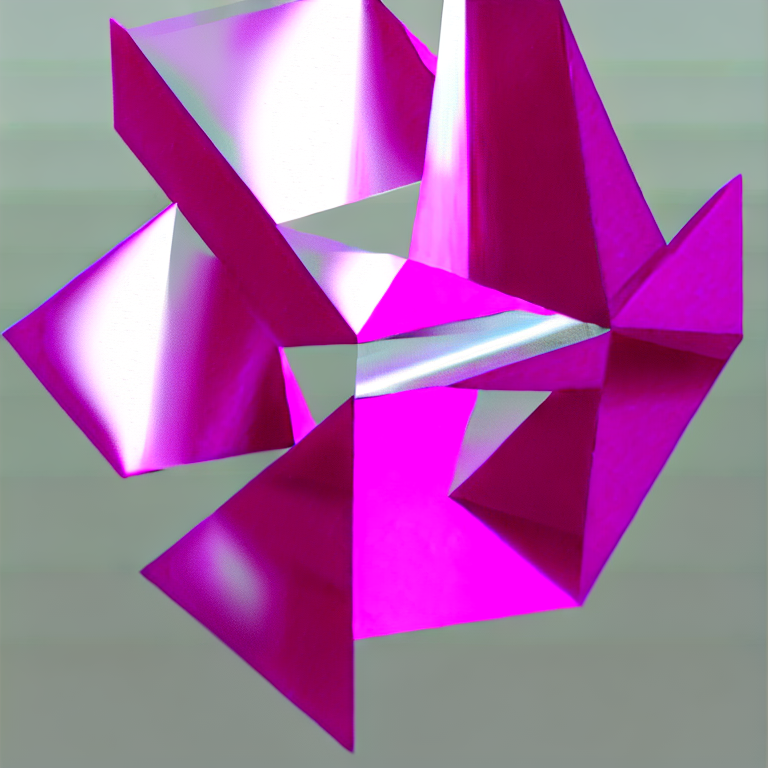

layer_difference=40
decoded text =  A
score=0.42551479339599607
svg length: 8166
final score: 0.45497746467590333


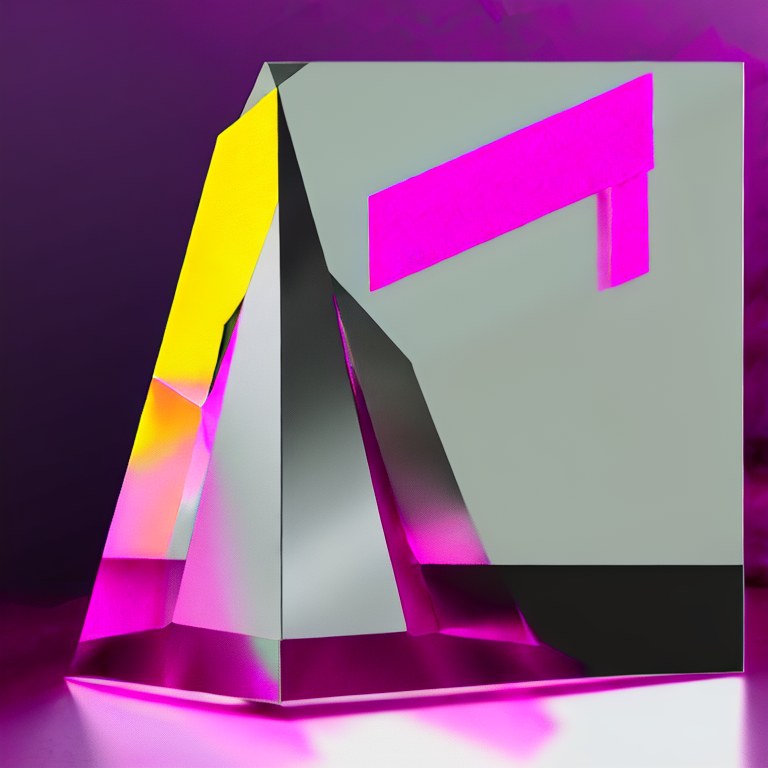

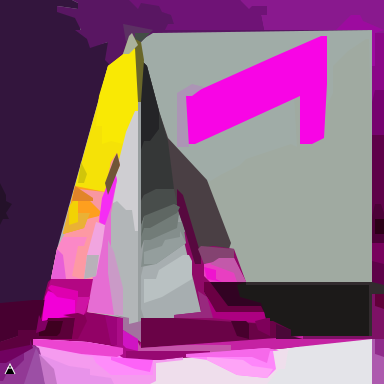

<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale(3.0)"><polygon points="0,0 128,0 128,128 0,128" fill="#999FA0"/><polygon points="51,10 124,10 124,94 82,94 78,87 72,71 67,59 55,46 50,31 47,18 47,13" fill="#A0ACA7"/><polygon points="0,0 24,0 26,1 26,3 19,2 19,4 26,4 27,11 32,15 36,14 36,20 37,22 17,94 13,109 12,110 6,110 6,112 0,114" fill="#33153D"/><polygon points="122,13 123,13 124,57 124,94 82,94 78,87 72,71 69,61 74,58 80,55 82,53 97,48 99,49 98,32 100,32 100,48 108,45 109,35 111,31 111,22 116,17" fill="#A0AAA1"/><polygon points="45,15 46,15 46,111 45,108 43,108 42,106 29,104 30,95 31,93 17,93 19,83 36,22" fill="#B2B6B8"/><polygon points="124,45 128,45 128,98 124,98 124,112 88,114 62,116 47,116 47,106 79,106 88,107 88,105 72,104 68,97 68,94 124,94" fill="#1C1A19"/><polygon points="11,113 29,114 41,116 42,119 53,119 89,116 116,113 124,113 124,128 15,128 12,116" fill="#EFDEEC"/><polygon points="24,0 128,0 128,45 124,45 124,10 51,11 46,14 44,12 40,20 37,22 35,20 

In [16]:
%%time
r = train_df.iloc[9]
description = r.description
description = "A digital painting of magenta trapzoid layered on a translucent silver sheet. In the middle of the painting is a trapezoid in magenta color. A transluscent silver sheet is placed under it."
print(description)
svg, img = model.predict_impl(description)
display(img)
display(SVG(svg))
print(svg)

In [ ]:
print(r.multiple_choice_qa)
metric.score_instance(r.multiple_choice_qa, svg, random_seed=42)

{'question': ['Is the color silver present in the image?', "Which word describes the silver sheet's ability to let light through?", 'Are the trapezoids layered on something?', 'What shape are the magenta objects?'], 'choices': [['no', 'yes'], ['opaque', 'reflective', 'solid', 'translucent'], ['no', 'yes'], ['circles', 'stars', 'trapezoids', 'triangles']], 'answer': ['yes', 'translucent', 'yes', 'trapezoids']}
decoded text =  A


{'competition_score': 0.2813020546848317,
 'vqa_score': 0.2550223004440598,
 'ocr_score': 1.0,
 'aesthetic_score': 0.47856388092041013}

## Evaluate on train dataset (LB prediction!)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import pandas as pd
from tqdm.auto import tqdm
tqdm.pandas()

In [ ]:
train_df.head()

,id,description,qa,question,choices,answer,multiple_choice_qa,raw_res,svg,bitmap,bitmap_score,svg_score
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...,"(<svg width=""384"" height=""384"" viewBox=""0 0 38...","<svg width=""384"" height=""384"" viewBox=""0 0 384...",<PIL.Image.Image image mode=RGB size=768x768 a...,"{'competition_score': 0.8901431479242317, 'vqa...","{'competition_score': 0.865245298187411, 'vqa_..."
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What...","(<svg width=""384"" height=""384"" viewBox=""0 0 38...","<svg width=""384"" height=""384"" viewBox=""0 0 384...",<PIL.Image.Image image mode=RGB size=768x768 a...,"{'competition_score': 0.6186997728493242, 'vqa...","{'competition_score': 0.6653128725786169, 'vqa..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...,"(<svg width=""384"" height=""384"" viewBox=""0 0 38...","<svg width=""384"" height=""384"" viewBox=""0 0 384...",<PIL.Image.Image image mode=RGB size=768x768 a...,"{'competition_score': 0.004712466096598103, 'v...","{'competition_score': 0.6977944459301226, 'vqa..."
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the...","(<svg width=""384"" height=""384"" viewBox=""0 0 38...","<svg width=""384"" height=""384"" viewBox=""0 0 384...",<PIL.Image.Image image mode=RGB size=768x768 a...,"{'competition_score': 0.5111754746171845, 'vqa...","{'competition_score': 0.002590665914844968, 'v..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I...","(<svg width=""384"" height=""384"" viewBox=""0 0 38...","<svg width=""384"" height=""384"" viewBox=""0 0 384...",<PIL.Image.Image image mode=RGB size=768x768 a...,"{'competition_score': 0.519547741462254, 'vqa_...","{'competition_score': 0.33868978436315766, 'vq..."


In [ ]:
%%time
train_df['raw_res'] = train_df.description.progress_apply(model.predict_impl)

  0%|          | 0/15 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:02<00:00, 10.19it/s]


decoded text =  A
score=0.5302664756774902
svg length: 9536


100%|██████████| 25/25 [00:02<00:00, 10.43it/s]


decoded text =  A
score=0.5404502868652343
svg length: 9455


100%|██████████| 25/25 [00:02<00:00, 10.16it/s]


decoded text =  A
score=0.5558846473693848
svg length: 8220


 13%|█▎        | 2/15 [00:12<01:24,  6.49s/it]

decoded text =  A
score=0.5482483386993409
svg length: 8896
final score: 0.5558846473693848


100%|██████████| 25/25 [00:02<00:00, 10.23it/s]


decoded text =  A
score=0.4877162456512451
svg length: 9109


100%|██████████| 25/25 [00:02<00:00, 10.30it/s]


decoded text =  A
score=0.5006210803985596
svg length: 8959


100%|██████████| 25/25 [00:02<00:00, 10.30it/s]


decoded text =  A
score=0.5124005317687989
svg length: 8732


 20%|██        | 3/15 [00:25<01:47,  8.92s/it]

decoded text =  A
score=0.5241818428039551
svg length: 8610
final score: 0.5241818428039551


100%|██████████| 25/25 [00:02<00:00, 10.20it/s]


decoded text =  A
score=0.5142284393310547
svg length: 7511


100%|██████████| 25/25 [00:02<00:00, 10.13it/s]


decoded text =  A
score=0.46956806182861327
svg length: 6310


100%|██████████| 25/25 [00:02<00:00, 10.39it/s]


decoded text =  A
score=0.513207483291626
svg length: 8007


 27%|██▋       | 4/15 [00:37<01:50, 10.08s/it]

decoded text =  A
score=0.49451231956481934
svg length: 5893
final score: 0.5142284393310547


100%|██████████| 25/25 [00:02<00:00, 10.37it/s]


decoded text =  A
score=0.46825637817382815
svg length: 9360


100%|██████████| 25/25 [00:02<00:00, 10.53it/s]


decoded text =  A
score=0.45392823219299316
svg length: 8131


100%|██████████| 25/25 [00:02<00:00, 10.23it/s]


decoded text =  A
score=0.4429035186767578
svg length: 8622


 33%|███▎      | 5/15 [00:49<01:48, 10.86s/it]

decoded text =  A
score=0.47643585205078126
svg length: 9550
final score: 0.47643585205078126


100%|██████████| 25/25 [00:02<00:00, 10.51it/s]


decoded text =  A
score=0.5048828125
svg length: 9032


100%|██████████| 25/25 [00:02<00:00, 10.51it/s]


decoded text =  A
score=0.48398423194885254
svg length: 9864


100%|██████████| 25/25 [00:02<00:00, 10.39it/s]


decoded text =  A
score=0.4237529754638672
svg length: 9663


 40%|████      | 6/15 [01:02<01:42, 11.36s/it]

decoded text =  A
score=0.47300329208374026
svg length: 9049
final score: 0.5048828125


100%|██████████| 25/25 [00:02<00:00, 10.42it/s]


decoded text =  A
score=0.46516985893249513
svg length: 9659


100%|██████████| 25/25 [00:02<00:00, 10.41it/s]


decoded text =  A
score=0.4248654842376709
svg length: 9206


100%|██████████| 25/25 [00:02<00:00, 10.54it/s]


decoded text =  A
score=0.43563084602355956
svg length: 9041


 47%|████▋     | 7/15 [01:14<01:34, 11.79s/it]

decoded text =  A
score=0.4452323913574219
svg length: 8964
final score: 0.46516985893249513


100%|██████████| 25/25 [00:02<00:00, 10.50it/s]


decoded text =  A
score=0.5207006454467773
svg length: 9265


100%|██████████| 25/25 [00:02<00:00, 10.48it/s]


decoded text =  A
score=0.4494072437286377
svg length: 7288


100%|██████████| 25/25 [00:02<00:00, 10.53it/s]


decoded text =  A
score=0.515567684173584
svg length: 9244


 53%|█████▎    | 8/15 [01:26<01:23, 11.88s/it]

decoded text =  A
score=0.5571884632110595
svg length: 8542
final score: 0.5571884632110595


100%|██████████| 25/25 [00:02<00:00, 10.34it/s]


decoded text =  A
score=0.47132420539855957
svg length: 9459


100%|██████████| 25/25 [00:02<00:00, 10.43it/s]


decoded text =  A
score=0.48475966453552244
svg length: 9745


100%|██████████| 25/25 [00:02<00:00, 10.31it/s]


decoded text =  A
score=0.47402019500732423
svg length: 9129


 60%|██████    | 9/15 [01:39<01:12, 12.11s/it]

decoded text =  A
score=0.4057210922241211
svg length: 9970
final score: 0.48475966453552244


100%|██████████| 25/25 [00:02<00:00, 10.39it/s]


decoded text =  A
score=0.4917269229888916
svg length: 9632


100%|██████████| 25/25 [00:02<00:00, 10.44it/s]


decoded text =  A
score=0.4635673999786377
svg length: 9005


100%|██████████| 25/25 [00:02<00:00, 10.47it/s]


decoded text =  A
score=0.4501366138458252
svg length: 9399


 67%|██████▋   | 10/15 [01:51<01:00, 12.14s/it]

decoded text =  A
score=0.47744903564453123
svg length: 9272
final score: 0.4917269229888916


100%|██████████| 25/25 [00:02<00:00, 10.43it/s]


decoded text =  A
score=0.4692078113555908
svg length: 9903


100%|██████████| 25/25 [00:02<00:00, 10.21it/s]


decoded text =  A
score=0.4709619998931885
svg length: 9984


100%|██████████| 25/25 [00:02<00:00, 10.41it/s]


decoded text =  A
score=0.4938460350036621
svg length: 7687


 73%|███████▎  | 11/15 [02:03<00:48, 12.17s/it]

decoded text =  A
score=0.48392887115478517
svg length: 7329
final score: 0.4938460350036621


100%|██████████| 25/25 [00:02<00:00, 10.31it/s]


decoded text =  A
score=0.5100662708282471
svg length: 8406


100%|██████████| 25/25 [00:02<00:00, 10.35it/s]


decoded text =  A
score=0.5003965854644775
svg length: 9483


100%|██████████| 25/25 [00:02<00:00, 10.21it/s]


decoded text =  A
score=0.48314657211303713
svg length: 9138


 80%|████████  | 12/15 [02:16<00:36, 12.30s/it]

decoded text =  A
score=0.5277318954467773
svg length: 8279
final score: 0.5277318954467773


100%|██████████| 25/25 [00:02<00:00, 10.34it/s]


decoded text =  A
score=0.4800511360168457
svg length: 8578


100%|██████████| 25/25 [00:02<00:00, 10.38it/s]


decoded text =  A
score=0.44060664176940917
svg length: 9286


100%|██████████| 25/25 [00:02<00:00, 10.41it/s]


decoded text =  A
score=0.4565557956695557
svg length: 9876


 87%|████████▋ | 13/15 [02:28<00:24, 12.32s/it]

decoded text =  A
score=0.46901636123657225
svg length: 9623
final score: 0.4800511360168457


100%|██████████| 25/25 [00:02<00:00, 10.18it/s]


decoded text =  A
score=0.5015625953674316
svg length: 9640


100%|██████████| 25/25 [00:02<00:00, 10.30it/s]


decoded text =  A
score=0.5684649467468261
svg length: 8057


100%|██████████| 25/25 [00:02<00:00, 10.37it/s]


decoded text =  A
score=0.5460967540740966
svg length: 8388


 93%|█████████▎| 14/15 [02:40<00:12, 12.23s/it]

decoded text =  A
score=0.5399374961853027
svg length: 9817
final score: 0.5684649467468261


100%|██████████| 25/25 [00:02<00:00, 10.30it/s]


decoded text =  A
score=0.4022835731506348
svg length: 4617


100%|██████████| 25/25 [00:02<00:00, 10.27it/s]


decoded text =  A
score=0.4600914478302002
svg length: 4978


100%|██████████| 25/25 [00:02<00:00, 10.36it/s]


decoded text =  A
score=0.4599411964416504
svg length: 4010


100%|██████████| 15/15 [02:52<00:00, 12.11s/it]

decoded text =  A
score=0.4766241550445557
svg length: 4549
final score: 0.4766241550445557


100%|██████████| 25/25 [00:02<00:00, 10.41it/s]


decoded text =  A
score=0.5252434730529785
svg length: 8661


100%|██████████| 25/25 [00:02<00:00, 10.45it/s]


decoded text =  A
score=0.4459959030151367
svg length: 8282


100%|██████████| 25/25 [00:02<00:00, 10.38it/s]


decoded text =  A
score=0.47713489532470704
svg length: 8586


100%|██████████| 15/15 [03:04<00:00, 12.31s/it]

decoded text =  A
score=0.492862606048584
svg length: 7036
final score: 0.5252434730529785
CPU times: total: 1min 9s
Wall time: 3min 4s


In [ ]:
train_df['svg'] = train_df.raw_res.apply(lambda x: x[0])
train_df['bitmap'] = train_df.raw_res.apply(lambda x: x[1])

In [ ]:
train_df['bitmap_score'] = train_df.progress_apply(
    lambda r: bitmap_score_instance(r.multiple_choice_qa, r.bitmap, random_seed=42),
    axis=1,
)

 13%|█▎        | 2/15 [00:01<00:09,  1.30it/s]

decoded text =  ©2015 Michael S. Miller


 20%|██        | 3/15 [00:02<00:11,  1.07it/s]

decoded text =  © Burberry


 27%|██▋       | 4/15 [00:03<00:11,  1.01s/it]

decoded text =  ©2012


 33%|███▎      | 5/15 [00:04<00:10,  1.03s/it]

decoded text =  V


 40%|████      | 6/15 [00:05<00:09,  1.05s/it]

decoded text =  © PA


 47%|████▋     | 7/15 [00:07<00:08,  1.05s/it]

decoded text =  © Instagram


 53%|█████▎    | 8/15 [00:08<00:07,  1.12s/it]

decoded text =  @Artmajeur.com


 60%|██████    | 9/15 [00:09<00:06,  1.08s/it]

decoded text =  L


 67%|██████▋   | 10/15 [00:10<00:05,  1.07s/it]

decoded text =  @


 73%|███████▎  | 11/15 [00:11<00:04,  1.07s/it]

decoded text =  © Instagram


 80%|████████  | 12/15 [00:12<00:03,  1.06s/it]

decoded text =  1


 87%|████████▋ | 13/15 [00:13<00:02,  1.06s/it]

decoded text =  © Instagram


 93%|█████████▎| 14/15 [00:14<00:01,  1.06s/it]

decoded text =  *


100%|██████████| 15/15 [00:15<00:00,  1.04s/it]

decoded text =  A


100%|██████████| 15/15 [00:16<00:00,  1.12s/it]

decoded text =  @51CTO博客


In [ ]:
train_df['svg_score'] = train_df.progress_apply(
    lambda r: metric.score_instance(r.multiple_choice_qa, r.svg, random_seed=42),
    axis=1,
)

 13%|█▎        | 2/15 [00:01<00:06,  1.86it/s]

decoded text =  A


 20%|██        | 3/15 [00:02<00:08,  1.39it/s]

decoded text =  A


 27%|██▋       | 4/15 [00:03<00:09,  1.22it/s]

decoded text =  A


 33%|███▎      | 5/15 [00:03<00:08,  1.15it/s]

decoded text =  A


 40%|████      | 6/15 [00:04<00:08,  1.11it/s]

decoded text =  A


 47%|████▋     | 7/15 [00:05<00:07,  1.07it/s]

decoded text =  A


 53%|█████▎    | 8/15 [00:06<00:06,  1.05it/s]

decoded text =  A


 60%|██████    | 9/15 [00:07<00:05,  1.04it/s]

decoded text =  A


 67%|██████▋   | 10/15 [00:08<00:04,  1.03it/s]

decoded text =  A


 73%|███████▎  | 11/15 [00:09<00:03,  1.01it/s]

decoded text =  A


 80%|████████  | 12/15 [00:10<00:02,  1.01it/s]

decoded text =  L


 87%|████████▋ | 13/15 [00:11<00:01,  1.02it/s]

decoded text =  A


 93%|█████████▎| 14/15 [00:12<00:00,  1.02it/s]

decoded text =  :


100%|██████████| 15/15 [00:13<00:00,  1.03it/s]

decoded text =  A


100%|██████████| 15/15 [00:14<00:00,  1.01it/s]

decoded text =  A


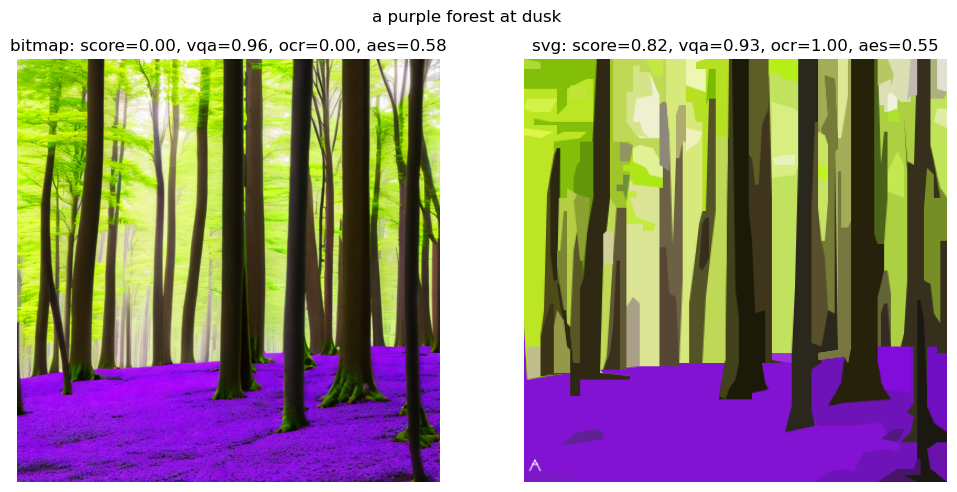

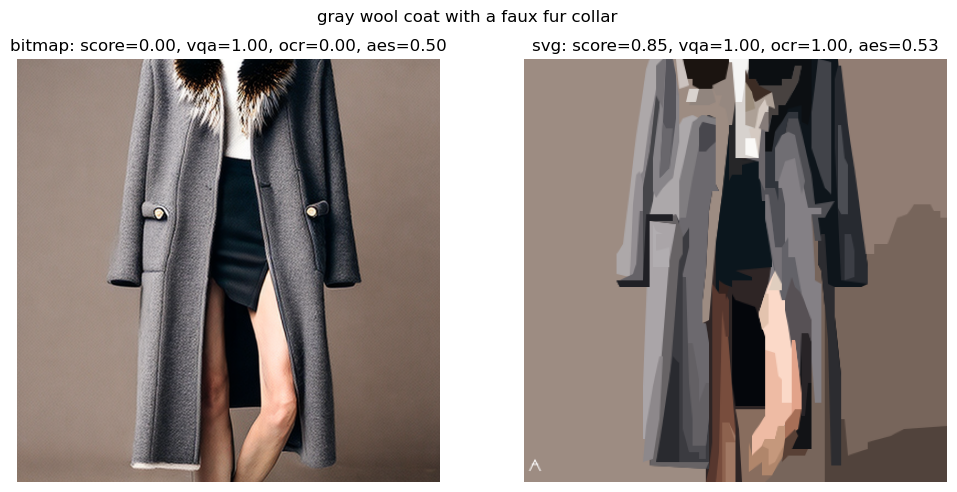

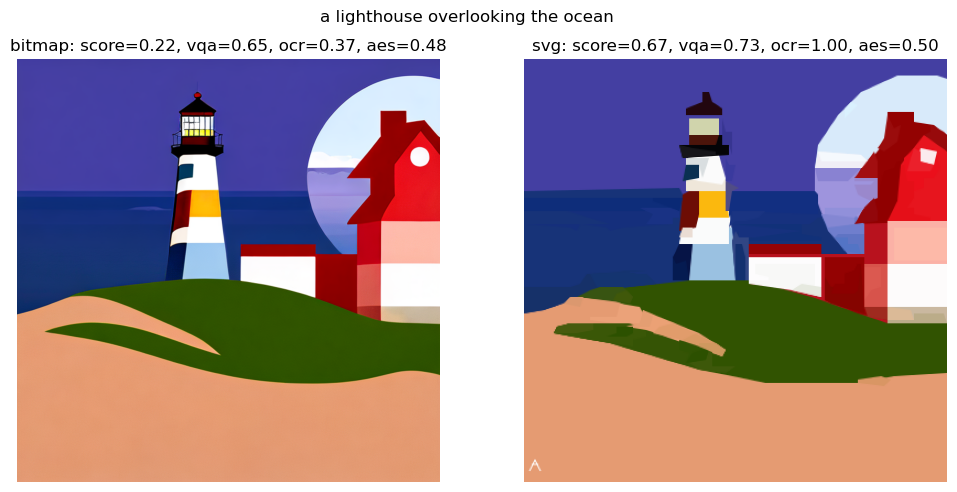

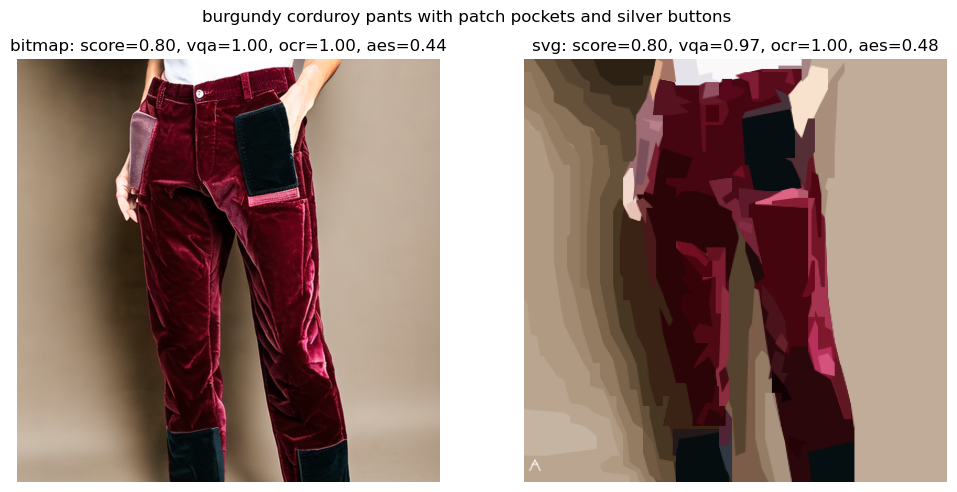

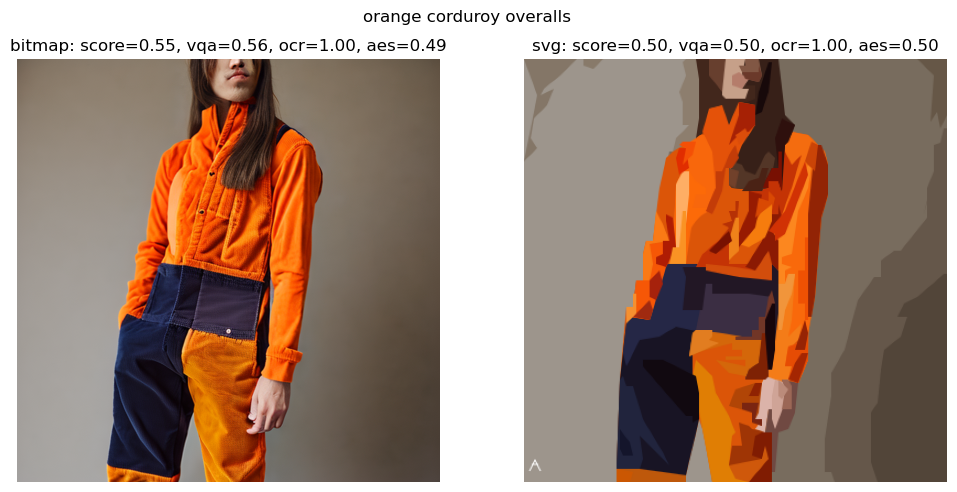

...

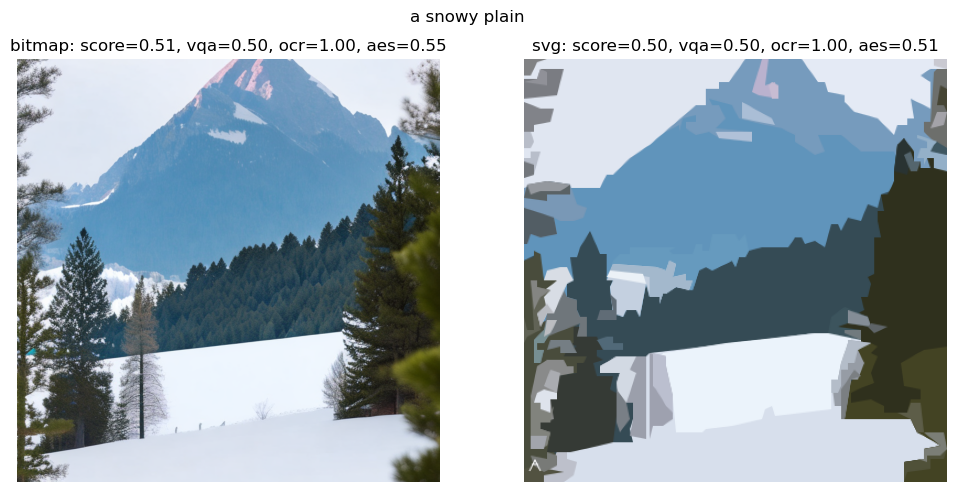

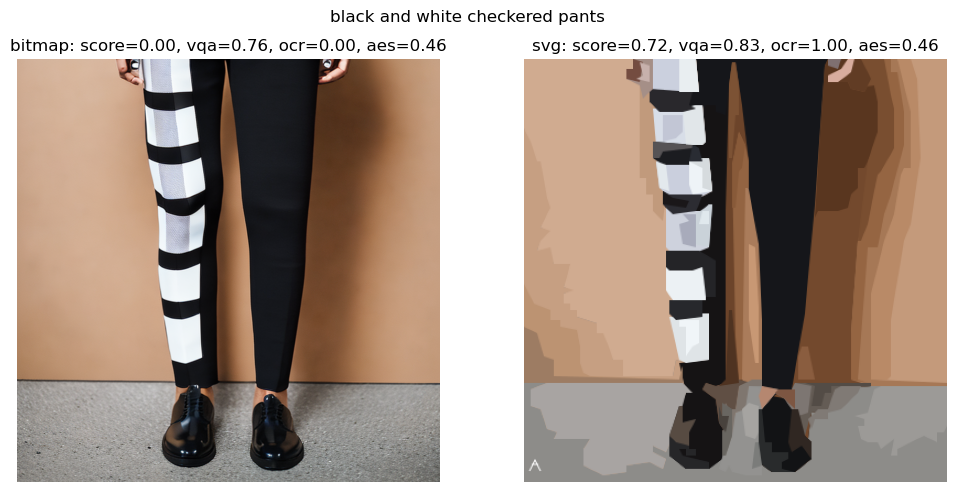

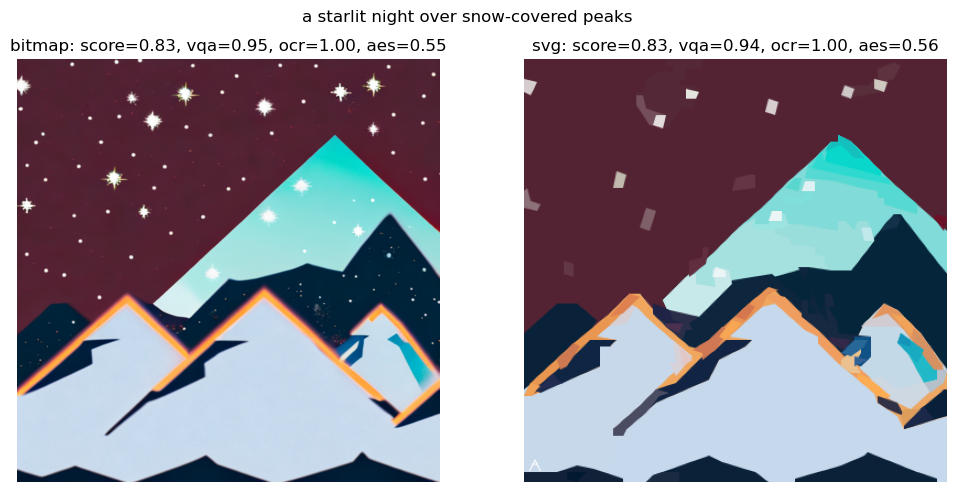

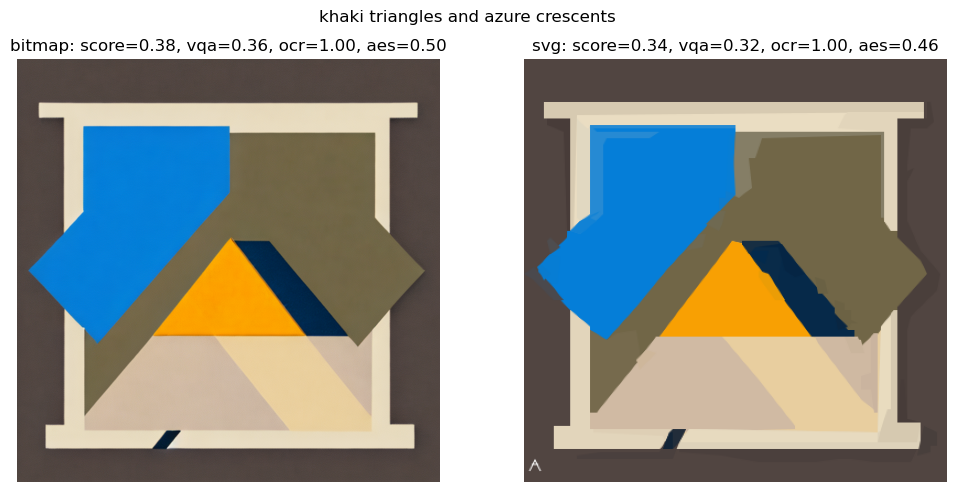

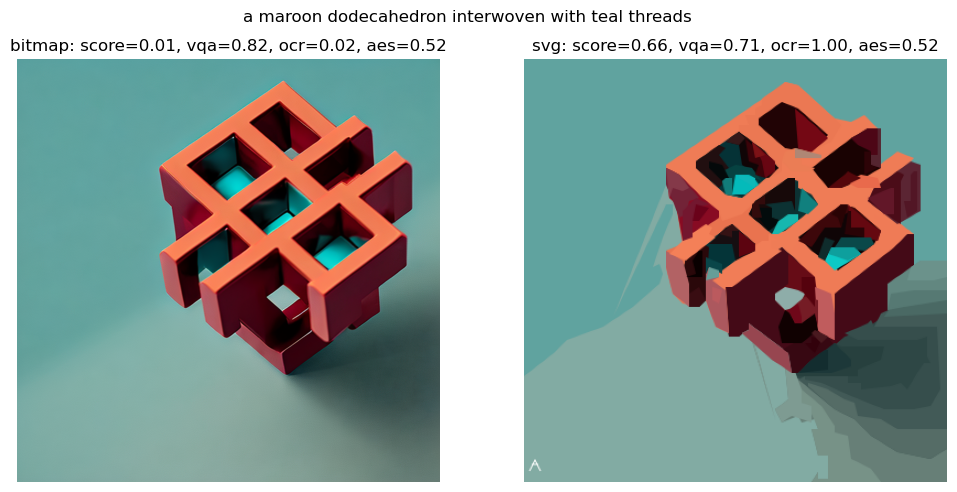

In [ ]:
for r in train_df.itertuples():
    b_score = r.bitmap_score['competition_score']
    b_vqa = r.bitmap_score['vqa_score']
    b_ocr = r.bitmap_score['ocr_score']
    b_aesthetic = r.bitmap_score['aesthetic_score']

    s_score = r.svg_score['competition_score']
    s_vqa = r.svg_score['vqa_score']
    s_ocr = r.svg_score['ocr_score']
    s_aesthetic = r.svg_score['aesthetic_score']
    
    plt.figure(figsize=(12, 6))
    plt.suptitle(r.description, y=0.93)
    
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(r.bitmap))
    plt.axis('off')
    plt.title(f'bitmap: score={b_score:.2f}, vqa={b_vqa:.2f}, ocr={b_ocr:.2f}, aes={b_aesthetic:.2f}')

    plt.subplot(1, 2, 2)
    plt.imshow(metric.svg_to_png(r.svg))
    plt.axis('off')
    plt.title(f'svg: score={s_score:.2f}, vqa={s_vqa:.2f}, ocr={s_ocr:.2f}, aes={s_aesthetic:.2f}')

In [ ]:
mean_bitmap_score = pd.DataFrame(train_df['bitmap_score'].tolist()).mean(axis=0)
mean_bitmap_score

competition_score    0.394347
vqa_score            0.631202
ocr_score            0.671656
aesthetic_score      0.571071
dtype: float64

In [ ]:
mean_svg_score = pd.DataFrame(train_df['svg_score'].tolist()).mean(axis=0)
mean_svg_score

competition_score    0.550188
vqa_score            0.598997
ocr_score            0.933783
aesthetic_score      0.540794
dtype: float64

In [ ]:
print(f'Original bitmap score: {mean_bitmap_score.competition_score}')
print(f'Final svg score: {mean_svg_score.competition_score}')

Original bitmap score: 0.3943470733057065
Final svg score: 0.5501881192977083
